# ResBaz 2020 | Data Analysis with Jupyter Notebooks

*By Konstantina Vasileva  
Victoria University of Wellington  
@konstantinnna*

## Intro | Markdown for text & image formatting

<img src="https://docs.microsoft.com/en-us/azure/cosmos-db/media/cosmosdb-jupyter-notebooks/cosmos-notebooks-overview.png"  width="800">

<img src="jupy.png" width="75" height="50" />

[Markdown Cheatsheet](https://github.com/adam-p/markdown-here/wiki/Markdown-Cheatsheet)  
[More Markdown tips & tricks](https://medium.com/game-of-data/12-things-to-know-about-jupyter-notebook-markdown-3f6cef811707)  
[Formatting & resizing images](https://www.xaprb.com/blog/how-to-style-images-with-markdown/)

<span style='background:yellow'> *Press __Shift + Enter__ to run the current cell </span>


### You can explore this Jupyter Notebook or use the RISE extension to enter in Presentation mode

<span style='background:yellow'> *Press __Alt + r__ to go in & out of the Presentation mode </span>


## Intro | Writing code
### Installing packages & libraries

[Tips & Tricks](https://www.dataquest.io/blog/jupyter-notebook-tips-tricks-shortcuts/)  


 * __Install packages__ using the __pip__ package manager
 
 <span style='background:yellow'> If you get an Invalid syntax error with __pip__ use __!pip__  (! - shell command)  
    If you need to install a package for a specific python version you can specify __pip2__,etc.  </span>


The ! tells the notebook to execute the cell as a shell command.



In [59]:
#!pip install folium
#!pip install plotly-express
#!pip install RISE

If the RISE icon does not show up after this !pip install, hit the Refresh button and look for it in the upper right corner of the icons bar

![](rise.jpg)

 * Pay attention to the __status of the cell__ you are running __In[ ]:__ <span style='background:yellow'>  
__In [ *]__ means it is still being processed  </span>

 * Import the relevant __libraries__ you will be using  
 <span style='background:yellow'> You can specify shorter names so you don't have to write the name of the entire library:  
   __import__ matplotlib.pyplot __as plt__  </span>

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import pylab as pl
import numpy as np
import plotly
import plotly.express as px 
import folium
import requests
import json 
import seaborn as sns

C:\Users\inni4\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


**Package vs Library**  
**Package**: Directory with collections of modules (routines containing functions, global variables, etc)  
**Library**: A collection of already compiled code which allows you to perform a variety of operations and access related functionalities without writing your own code

## Step 2 | Loading data files
* Files stored in your __local folder__
* Loading via __URL__
* Generating __requests__ using an API

Let's look at some COVID-19 data provided by Our World in Data (data for 216 countries in the world)
For the sake of this demonstration & to make data cleaning/wrangling easier we will focus only on recent data, as of Nov 20th 2020


In [2]:
# Loading the COVID-19 dataset from a local file
df = pd.read_csv("owid_clean.csv")

In [231]:
# Loading the COVID-19 dataset directly from the website
df = pd.read_csv("https://covid.ourworldindata.org/data/owid-covid-data.csv")

# Example of an API request (different dataset)
dfAPI = requests.get('https://www.govt.nz/api/v2/organisation/914.json?fields=names')
#data.status_code

In [5]:
# Selecting only data as of Nov 20th
dfnov = df.loc[df['date'] == '20/11/2020']
dfnov.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
200,USA,North America,United States,20/11/2020,11717827.0,188020.0,166146.57,252555.0,2018.0,1446.43,...,54225.45,1.2,151.09,10.79,19.1,24.6,NaN,2.77,78.86,0.92
315,BRA,South America,Brazil,20/11/2020,5981767.0,35918.0,28597.86,168061.0,606.0,540.00,...,14103.45,3.4,177.96,8.11,10.1,17.9,NaN,2.20,75.88,0.76
423,IND,Asia,India,20/11/2020,9004365.0,45882.0,39367.14,132162.0,584.0,499.14,...,6426.67,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66,0.64
558,MEX,North America,Mexico,20/11/2020,1019543.0,4472.0,3958.29,100104.0,576.0,435.43,...,17336.47,2.5,152.78,13.06,6.9,21.4,87.85,1.38,75.05,0.77
787,GBR,Europe,United Kingdom,20/11/2020,1453256.0,22915.0,23294.43,53775.0,501.0,406.71,...,39753.24,0.2,122.14,4.28,20.0,24.7,NaN,2.54,81.32,0.92


### Exploring & Plotting data

__Depending on our goals, skills and needs__ we can use notebooks for anything from simple plots...

...to advanced interactive visualisations (brain imaging, choropleth maps, space simulations, etc.)
! <img src="https://2017.spaceappschallenge.org/images/team-photos-mB1SwG0r-rHKnOWm3kFxcbC1Yo3925width-800.png"  width="600">

In [8]:
%lsmagic

Available line magics:
%alias  %alias_magic  %autoawait  %autocall  %automagic  %autosave  %bookmark  %cd  %clear  %cls  %colors  %conda  %config  %connect_info  %copy  %ddir  %debug  %dhist  %dirs  %doctest_mode  %echo  %ed  %edit  %env  %gui  %hist  %history  %killbgscripts  %ldir  %less  %load  %load_ext  %loadpy  %logoff  %logon  %logstart  %logstate  %logstop  %ls  %lsmagic  %macro  %magic  %matplotlib  %mkdir  %more  %notebook  %page  %pastebin  %pdb  %pdef  %pdoc  %pfile  %pinfo  %pinfo2  %pip  %popd  %pprint  %precision  %prun  %psearch  %psource  %pushd  %pwd  %pycat  %pylab  %qtconsole  %quickref  %recall  %rehashx  %reload_ext  %ren  %rep  %rerun  %reset  %reset_selective  %rmdir  %run  %save  %sc  %set_env  %store  %sx  %system  %tb  %time  %timeit  %unalias  %unload_ext  %who  %who_ls  %whos  %xdel  %xmode

Available cell magics:
%%!  %%HTML  %%SVG  %%bash  %%capture  %%cmd  %%debug  %%file  %%html  %%javascript  %%js  %%latex  %%markdown  %%perl  %%prun  %%pypy  %%python 

In [9]:
# Our World in Data provides a large dataset with multiple rows of data per country over time:
# - somee variables capture general information (population_density, median_age, gdp_per_capita, etc)
# - others are updated over time (new_cases, new_deaths, etc)

# For the sake of this ResBaz presentation we'll skip complex data cleaning and wrangling 
# and only work with the data available until the 3rd week of Nov 2020

# We can look at all column names to get a better idea of the collected variables
for col in df.columns: 
    print(col) 
    

iso_code
continent
location
date
total_cases
new_cases
new_cases_smoothed
total_deaths
new_deaths
new_deaths_smoothed
total_cases_per_million
new_cases_per_million
new_cases_smoothed_per_million
total_deaths_per_million
new_deaths_per_million
new_deaths_smoothed_per_million
reproduction_rate
icu_patients
icu_patients_per_million
hosp_patients
hosp_patients_per_million
weekly_icu_admissions
weekly_icu_admissions_per_million
weekly_hosp_admissions
weekly_hosp_admissions_per_million
total_tests
new_tests
total_tests_per_thousand
new_tests_per_thousand
new_tests_smoothed
new_tests_smoothed_per_thousand
tests_per_case
positive_rate
tests_units
stringency_index
population
population_density
median_age
aged_65_older
aged_70_older
gdp_per_capita
extreme_poverty
cardiovasc_death_rate
diabetes_prevalence
female_smokers
male_smokers
handwashing_facilities
hospital_beds_per_thousand
life_expectancy
human_development_index
Unnamed: 50
Unnamed: 51
Unnamed: 52
Unnamed: 53
Unnamed: 54
Unnamed: 55
Unna

 <span style='background:yellow'> __Magics use syntax elements which are not valid in the underlying language__. E.g % is not a valid operator in Python. They are also __specific to the used kernel__ </span>

[More details](https://ipython.readthedocs.io/en/stable/interactive/magics.html)

<IPython.core.display.Javascript object>


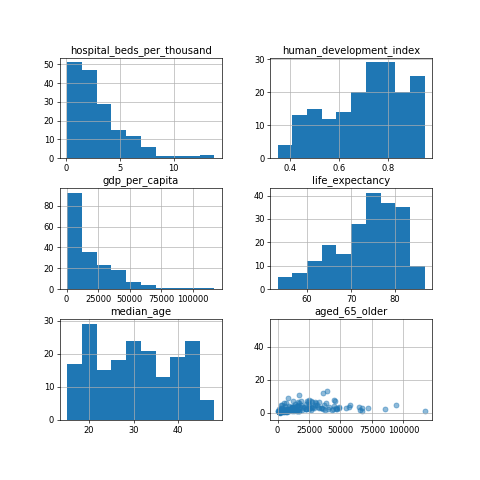

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001B9367EE3C8>,
      dtype=object)

In [91]:
viz = dfnov[['hospital_beds_per_thousand','human_development_index','gdp_per_capita','life_expectancy', 'median_age','aged_65_older']]
viz.hist(figsize=(8,8))

In [75]:
%matplotlib notebook

### Magic functions (%) & Other Functionalities

__Line magic %__: current line   
__Cell magic %%__: multiple lines


__%matplotlib inline__ : static  
__%matplotlib notebook__ : interactive


In [92]:
# Exploratory data analysis: correlation plots
x = dfnov['gdp_per_capita']
y = dfnov ['hospital_beds_per_thousand']

plt.scatter(x, y,  alpha = 0.5) 
plt.show()

<IPython.core.display.Javascript object>


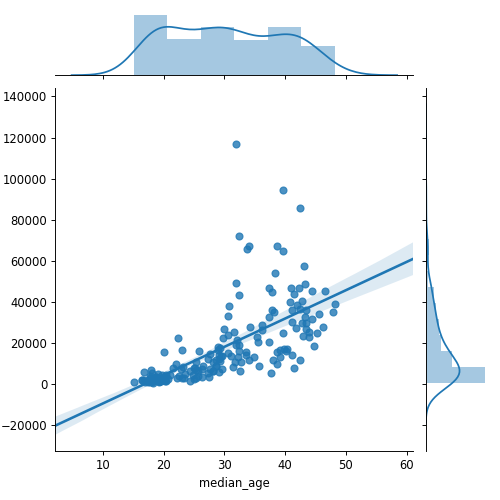

Text(0.5, 1, 'Scatter Plot with Marginal Histograms')

In [15]:
sns.jointplot(x="median_age", 
              y="gdp_per_capita",
              kind ="reg",
              data=dfnov)
plt.title("Scatter Plot with Marginal Histograms", size=18, pad=80)
#plt.savefig("marginal_plot_Seaborn.png",figsize=(4,4), dpi=150)

<IPython.core.display.Javascript object>


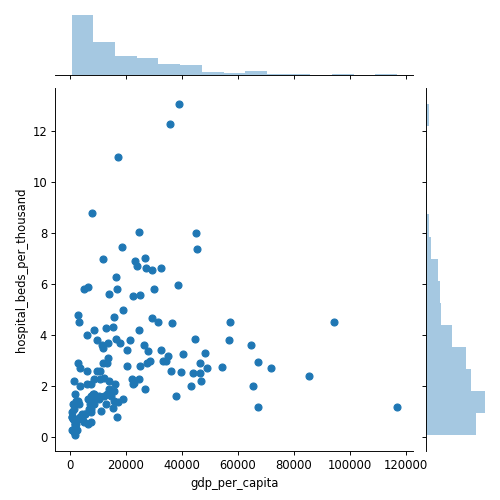

Text(0.5, 1, 'Scatter Plot with Marginal Histograms')

In [11]:
sns.jointplot(x="gdp_per_capita", 
              y="hospital_beds_per_thousand",
              #kind ="reg",
              data=dfnov);
plt.title("Scatter Plot with Marginal Histograms", size=18, pad=80)
#plt.savefig("marginal_plot_Seaborn.png",figsize=(4,4), dpi=150)

In [13]:
%matplotlib notebook

<IPython.core.display.Javascript object>


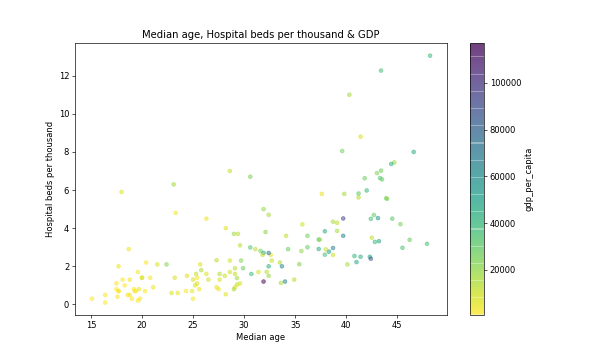

Text(0, 0.5, 'Hospital beds per thousand')

In [95]:
fig, ax = plt.subplots(figsize=(10, 6))
dfnov.plot.scatter(x='median_age',
                      y='hospital_beds_per_thousand',
                      c='gdp_per_capita',
                      colormap='viridis_r', ax =ax,
                      figsize=(10,6),  alpha = 0.5)
plt.title('Median age, Hospital beds per thousand & GDP')
plt.xlabel('Median age')
plt.ylabel('Hospital beds per thousand')

In [19]:
%matplotlib notebook

### Handy list of built-in Color Scales

In [17]:
from textwrap import wrap

named_colorscales = px.colors.named_colorscales()
print("\n".join(wrap("".join('{:<12}'.format(c) for c in named_colorscales), 96)))

aggrnyl     agsunset    blackbody   bluered     blues       blugrn      bluyl       brwnyl
bugn        bupu        burg        burgyl      cividis     darkmint    electric    emrld
gnbu        greens      greys       hot         inferno     jet         magenta     magma
mint        orrd        oranges     oryel       peach       pinkyl      plasma      plotly3
pubu        pubugn      purd        purp        purples     purpor      rainbow     rdbu
rdpu        redor       reds        sunset      sunsetdark  teal        tealgrn     viridis
ylgn        ylgnbu      ylorbr      ylorrd      algae       amp         deep        dense
gray        haline      ice         matter      solar       speed       tempo       thermal
turbid      armyrose    brbg        earth       fall        geyser      prgn        piyg
picnic      portland    puor        rdgy        rdylbu      rdylgn      spectral    tealrose
temps       tropic      balance     curl        delta       edge        hsv         icefire


<IPython.core.display.Javascript object>


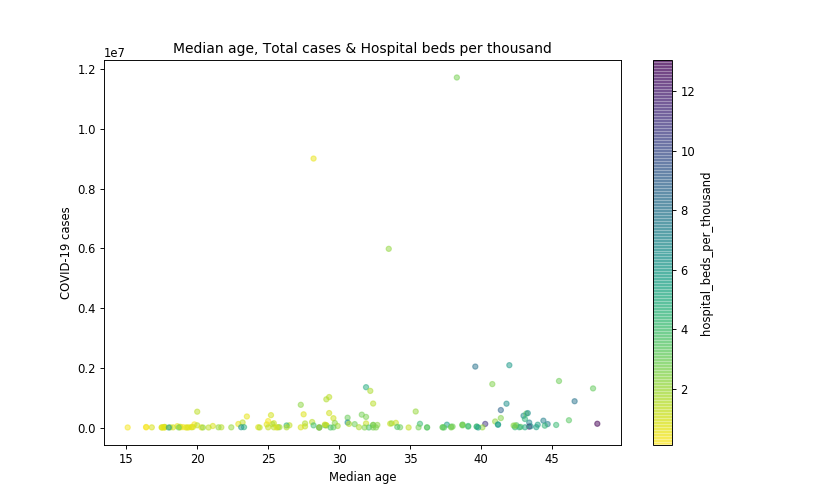

Text(0, 0.5, 'COVID-19 cases')

In [16]:
fig, ax = plt.subplots(figsize=(10, 6))
dfnov.plot.scatter(x='median_age',
                      y='total_cases',
                      c='hospital_beds_per_thousand',
                      colormap='viridis_r', ax =ax,
                      figsize=(10,6),  alpha = .5)

plt.title('Median age, Total cases & Hospital beds per thousand')
plt.xlabel('Median age')
plt.ylabel('COVID-19 cases')

<IPython.core.display.Javascript object>


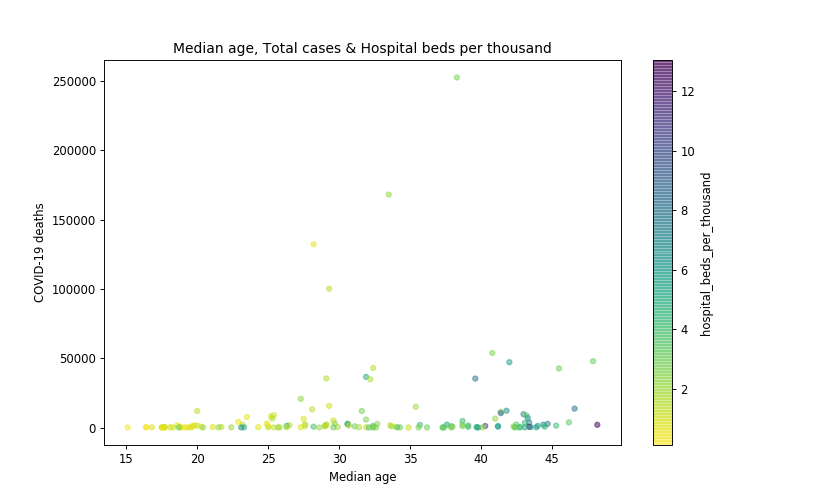

Text(0, 0.5, 'COVID-19 deaths')

In [17]:
fig, ax = plt.subplots(figsize=(10, 6))
dfnov.plot.scatter(x='median_age',
                      y='total_deaths',
                      c='hospital_beds_per_thousand',
                      colormap='viridis_r', ax =ax,
                      figsize=(10,6),  alpha = .5)

plt.title('Median age, Total cases & Hospital beds per thousand')
plt.xlabel('Median age')
plt.ylabel('COVID-19 deaths')

<IPython.core.display.Javascript object>


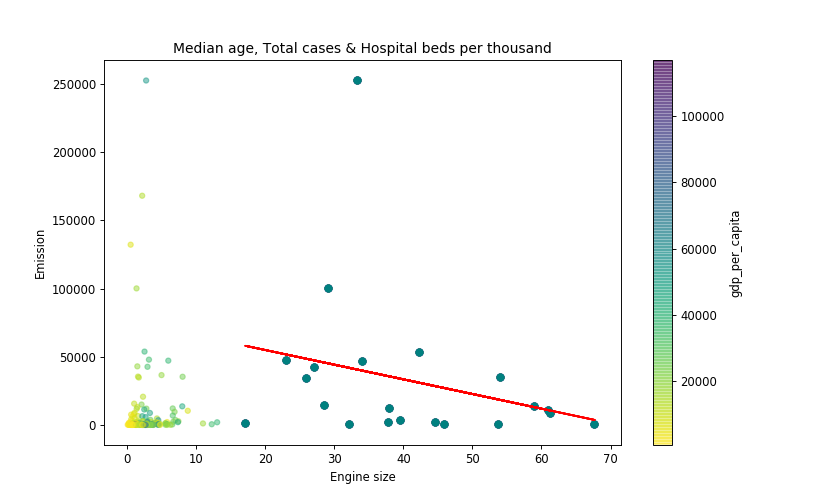

Text(0, 0.5, 'COVID-19 deaths')

In [19]:
fig, ax = plt.subplots(figsize=(10, 6))
dfnov.plot.scatter(x='hospital_beds_per_thousand',
                      y='total_deaths',
                      c='gdp_per_capita',
                      colormap='viridis_r', ax =ax,
                      figsize=(10,6),  alpha = .5)

plt.title('COVID-19 deaths, Hospital beds per thousand & GDP')
plt.xlabel('Hospital beds per thousand')
plt.ylabel('COVID-19 deaths')

In [20]:
dfcorr = dfnov [['total_cases', 'total_deaths','hospital_beds_per_thousand', 'gdp_per_capita','median_age','diabetes_prevalence','cardiovasc_death_rate']]
dfcorr.corr()

,total_cases,total_deaths,hospital_beds_per_thousand,gdp_per_capita,median_age,diabetes_prevalence,cardiovasc_death_rate
total_cases,1.000000,0.945138,-0.011180,0.110265,0.130452,0.019603,-0.111018
total_deaths,0.945138,1.000000,-0.033634,0.099156,0.132971,0.039723,-0.147863
hospital_beds_per_thousand,-0.011180,-0.033634,1.000000,0.293686,0.660367,-0.068480,0.023821
gdp_per_capita,0.110265,0.099156,0.293686,1.000000,0.642831,0.204460,-0.471166
median_age,0.130452,0.132971,0.660367,0.642831,1.000000,0.187868,-0.329156
diabetes_prevalence,0.019603,0.039723,-0.068480,0.204460,0.187868,1.000000,0.112771
cardiovasc_death_rate,-0.111018,-0.147863,0.023821,-0.471166,-0.329156,0.112771,1.000000


### Plotting the data on interactive maps

In [71]:
# Map of New Zealand
nz_map = folium.Map(width=800,height=600,
    location = [-41.2769, -174.7731],  # Latitude N/S,Longitude W/E Coordinates
    zoom_start = 4.5,
    tiles= 'Stamen Watercolor')

# Other styles: 'Stamen Terrain', 'Stamen Toner', etc

nz_map

# The story
![](aej.jpg)

1. Geopolitical factors
2. Strategic planning & policies
3. __Trust in science__
4. __Trust in institutions__
5. __Media freedom?__

### Are the factors contributing to NZ's success diagnostic of how other countries are handling the pandemic?

In [24]:
# Map of the world
#map = folium.Map()
#map

### We'll need some data!
[COVID-19 Source Data](https://ourworldindata.org/coronavirus-source-data) Our World in Data  
[Press Freedom Index 2020](https://rsf.org/en/ranking) Reporters without borders  
[Trust in government](https://data.oecd.org/gga/trust-in-government.htm) OECD data  
[Trust in Science Survey](https://www.frontiersin.org/articles/10.3389/fpubh.2020.621563/full) Rijs, C., & Fenter, F. (2020). The academic response to COVID-19. Frontiers in Public Health, 8, 797 

In [25]:
# We already started looking at COVID-19 data for November using dfnov so we will just add the new datasets
media = pd.read_csv("press.csv")
gov = pd.read_csv("oecd.csv")
sci = pd.read_csv("science.csv")

In [26]:
sci.head(5)

,country,disagree,neither,agree,all_resp
0,New Zealand,0.15,0.09,0.77,222
1,Greece,0.10,0.14,0.76,126
2,China,0.14,0.15,0.71,937
3,Argentina,0.12,0.18,0.70,208
4,Denmark,0.15,0.17,0.68,128


### We'll also need to do some data cleaning

In [27]:
# Survey responses to the question: Do you agree policy makers have taken scientific advice into account sufficiently during COVID-19?
# The sci dataset contains country names rather than Alpha-3 ISO ountry codes, so some conversion is necessary

#!pip install country_converter
import country_converter as cc

sci_list = ['New Zealand','Greece','China','Argentina','Denmark','Germany','Netherlands',
            'South Korea','Norway','Portugal','Austria','Australia','Canada','Sweden',
            'Switzerland','South Africa','Belgium','Turkey','India','Italy','Colombia',
            'Japan','France','Mexico','Spain','Russian Federation','Poland','United Kingdom',
            'Brazil','Chile','United States of America']
standard_names = cc.convert(names=sci_list, to='ISO3')
print(standard_names)

['NZL', 'GRC', 'CHN', 'ARG', 'DNK', 'DEU', 'NLD', 'KOR', 'NOR', 'PRT', 'AUT', 'AUS', 'CAN', 'SWE', 'CHE', 'ZAF', 'BEL', 'TUR', 'IND', 'ITA', 'COL', 'JPN', 'FRA', 'MEX', 'ESP', 'RUS', 'POL', 'GBR', 'BRA', 'CHL', 'USA']


In [28]:
# After they've been converted we just add the converted names to the initial file
sci['ISO'] = standard_names
sciselect = sci[['country','disagree','agree','ISO']]
sciselect = sciselect.rename(columns={'disagree': 'sci_disagree','agree': 'sci_agree'})

sciselect.head()

# Code info is also available here
# codes = pd.read_csv('https://gist.githubusercontent.com/tadast/8827699/raw/f5cac3d42d16b78348610fc4ec301e9234f82821/countries_codes_and_coordinates.csv', header=None)


,country,sci_disagree,sci_agree,ISO
0,New Zealand,0.15,0.77,NZL
1,Greece,0.10,0.76,GRC
2,China,0.14,0.71,CHN
3,Argentina,0.12,0.70,ARG
4,Denmark,0.15,0.68,DNK


In [29]:
# Preparing the media dataset by renaming the key variables we are interested in with more descriptive names and removing additional columns
media = media.rename(columns={'Score 2020': 'mediascore2020','Rank2020': 'mediarank2020'})

mediaselect = media[['ISO','mediascore2020','mediarank2020']]
mediaselect.head(5)

,ISO,mediascore2020,mediarank2020
0,AFG,"37,7",122
1,AGO,"33,92",106
2,ALB,"30,25",84
3,AND,"23,23",37
4,ARE,"42,69",131


In [30]:
gov.head(5)

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,AUS,TRUSTGOV,TOT,PC,A,2015,46.7,NaN
1,AUS,TRUSTGOV,TOT,PC,A,2016,45.7,NaN
2,AUS,TRUSTGOV,TOT,PC,A,2017,45.7,NaN
3,AUS,TRUSTGOV,TOT,PC,A,2018,45.7,NaN
4,AUT,TRUSTGOV,TOT,PC,A,2015,42.7,NaN


In [31]:
# In the gov dataset ISO codes are listed in a column named LOCATION so we need to rename it, so we can eventually merge the datasets
gov = gov.rename(columns={'LOCATION': 'ISO','Value': 'gov_trust'})
gov.head()


# We also want to have just one row of data per country, so we could try to look at the mean 
# Trust index per country in the last few years of data
govselect = gov[['ISO','gov_trust']]
govselect = gov.groupby('ISO', as_index=False)['gov_trust'].mean()

govselect.head(5)

,ISO,gov_trust
0,AUS,45.950
1,AUT,44.650
2,BEL,45.100
3,BRA,22.425
4,CAN,60.950


In [32]:
dfnov.head(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
200,USA,North America,United States,20/11/2020,11717827.0,188020.0,166146.57,252555.0,2018.0,1446.43,...,54225.45,1.2,151.09,10.79,19.1,24.6,NaN,2.77,78.86,0.92
315,BRA,South America,Brazil,20/11/2020,5981767.0,35918.0,28597.86,168061.0,606.0,540.00,...,14103.45,3.4,177.96,8.11,10.1,17.9,NaN,2.20,75.88,0.76
423,IND,Asia,India,20/11/2020,9004365.0,45882.0,39367.14,132162.0,584.0,499.14,...,6426.67,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66,0.64
558,MEX,North America,Mexico,20/11/2020,1019543.0,4472.0,3958.29,100104.0,576.0,435.43,...,17336.47,2.5,152.78,13.06,6.9,21.4,87.85,1.38,75.05,0.77
787,GBR,Europe,United Kingdom,20/11/2020,1453256.0,22915.0,23294.43,53775.0,501.0,406.71,...,39753.24,0.2,122.14,4.28,20.0,24.7,NaN,2.54,81.32,0.92


In [33]:
# Similarly to the above case, we can rename iso_code to ISO
dfnov = dfnov.rename(columns={'iso_code': 'ISO'})
dfnov.head(5)

,ISO,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
200,USA,North America,United States,20/11/2020,11717827.0,188020.0,166146.57,252555.0,2018.0,1446.43,...,54225.45,1.2,151.09,10.79,19.1,24.6,NaN,2.77,78.86,0.92
315,BRA,South America,Brazil,20/11/2020,5981767.0,35918.0,28597.86,168061.0,606.0,540.00,...,14103.45,3.4,177.96,8.11,10.1,17.9,NaN,2.20,75.88,0.76
423,IND,Asia,India,20/11/2020,9004365.0,45882.0,39367.14,132162.0,584.0,499.14,...,6426.67,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66,0.64
558,MEX,North America,Mexico,20/11/2020,1019543.0,4472.0,3958.29,100104.0,576.0,435.43,...,17336.47,2.5,152.78,13.06,6.9,21.4,87.85,1.38,75.05,0.77
787,GBR,Europe,United Kingdom,20/11/2020,1453256.0,22915.0,23294.43,53775.0,501.0,406.71,...,39753.24,0.2,122.14,4.28,20.0,24.7,NaN,2.54,81.32,0.92


### Now let's combine all this into a single dataset
Information about __COVID-19 cases__ +  
survey results on __trust in government institutions__+  
impact of __science__ on policy-making+  
__press freedom__

In [34]:
# First let's look at the df shape for each dataset. Unfortunately they do not cover all countries
# in the world with the smallest dataset being the one containing responses to the survey question:
# Do you agree policy makers have taken scientific advice into account sufficiently during COVID-19?
sciselect.shape #31 rows
mediaselect.shape #180 rows
govselect.shape #41 rows
dfnov.shape #214 rows


(213, 50)

In [35]:
# Data frames can be merged using a key (a column shared across them).Different types of merge/join:LEFT & RIGHT, OUTER & INNER join:
# you will lose rows that don’t have a match in the other DataFrame’s key column.  merge() defaults to an inner join 

In [36]:
dfmedia = pd.merge(dfnov, mediaselect, on=["ISO"])
dfmediagov = pd.merge (dfmedia,govselect, on =["ISO"])
dfmerge = pd.merge (dfmediagov,sciselect, on =["ISO"])
dfmerge = dfmerge.rename(columns={'ISO': 'id'})
dfmerge.head(10)

,id,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,mediascore2020,mediarank2020,gov_trust,country,sci_disagree,sci_agree
0,USA,North America,United States,20/11/2020,11717827.0,188020.0,166146.57,252555.0,2018.0,1446.43,...,NaN,2.77,78.86,0.92,"23,85",45,33.225,United States of America,0.66,0.18
1,BRA,South America,Brazil,20/11/2020,5981767.0,35918.0,28597.86,168061.0,606.0,540.00,...,NaN,2.20,75.88,0.76,"34,05",107,22.425,Brazil,0.64,0.23
2,MEX,North America,Mexico,20/11/2020,1019543.0,4472.0,3958.29,100104.0,576.0,435.43,...,87.85,1.38,75.05,0.77,"45,45",143,29.025,Mexico,0.42,0.39
3,GBR,Europe,United Kingdom,20/11/2020,1453256.0,22915.0,23294.43,53775.0,501.0,406.71,...,NaN,2.54,81.32,0.92,"22,93",35,42.225,United Kingdom,0.56,0.24
4,ITA,Europe,Italy,20/11/2020,1308528.0,36176.0,34589.57,47870.0,653.0,611.57,...,NaN,3.18,83.51,0.88,"23,69",41,23.025,Italy,0.26,0.49
5,FRA,Europe,France,20/11/2020,2086288.0,21150.0,26796.86,47127.0,429.0,595.29,...,NaN,5.98,82.66,0.90,"22,92",34,33.975,France,0.38,0.40
6,ESP,Europe,Spain,20/11/2020,1556730.0,15156.0,14019.86,42619.0,328.0,264.29,...,NaN,2.97,83.56,0.89,"22,16",29,27.100,Spain,0.45,0.33
7,RUS,Europe,Russia,20/11/2020,2039926.0,24318.0,25908.29,35311.0,461.0,468.43,...,NaN,8.05,72.58,0.82,"48,92",149,53.975,Russian Federation,0.33,0.30
8,COL,South America,Colombia,20/11/2020,1225490.0,7487.0,7354.00,34761.0,198.0,181.43,...,65.39,1.71,77.29,0.75,"42,66",130,25.925,Colombia,0.29,0.45
9,ZAF,Africa,South Africa,20/11/2020,759658.0,2514.0,2132.29,20671.0,115.0,85.00,...,43.99,2.32,64.13,0.70,"22,41",31,48.650,South Africa,0.29,0.52


In [37]:
dfmerge.head(5)

,id,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,mediascore2020,mediarank2020,gov_trust,country,sci_disagree,sci_agree
0,USA,North America,United States,20/11/2020,11717827.0,188020.0,166146.57,252555.0,2018.0,1446.43,...,NaN,2.77,78.86,0.92,"23,85",45,33.225,United States of America,0.66,0.18
1,BRA,South America,Brazil,20/11/2020,5981767.0,35918.0,28597.86,168061.0,606.0,540.00,...,NaN,2.20,75.88,0.76,"34,05",107,22.425,Brazil,0.64,0.23
2,MEX,North America,Mexico,20/11/2020,1019543.0,4472.0,3958.29,100104.0,576.0,435.43,...,87.85,1.38,75.05,0.77,"45,45",143,29.025,Mexico,0.42,0.39
3,GBR,Europe,United Kingdom,20/11/2020,1453256.0,22915.0,23294.43,53775.0,501.0,406.71,...,NaN,2.54,81.32,0.92,"22,93",35,42.225,United Kingdom,0.56,0.24
4,ITA,Europe,Italy,20/11/2020,1308528.0,36176.0,34589.57,47870.0,653.0,611.57,...,NaN,3.18,83.51,0.88,"23,69",41,23.025,Italy,0.26,0.49


In [38]:
dfmerge.shape

# There are only 27 rows left after merging (including the header row), so it looks like/
# only 26 countries were included across all 4 databases


(27, 56)

## We can now explore the merged data & visualise it with __Choropleth maps__ 

[Some handy color schemes for Choropleth](https://plotly.com/python/builtin-colorscales/)

In [39]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/johan/world.geo.json/master/countries.geo.json') as response:
    countries = json.load(response)


In [40]:
countries

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'id': 'AFG',
   'properties': {'name': 'Afghanistan'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[61.210817, 35.650072],
      [62.230651, 35.270664],
      [62.984662, 35.404041],
      [63.193538, 35.857166],
      [63.982896, 36.007957],
      [64.546479, 36.312073],
      [64.746105, 37.111818],
      [65.588948, 37.305217],
      [65.745631, 37.661164],
      [66.217385, 37.39379],
      [66.518607, 37.362784],
      [67.075782, 37.356144],
      [67.83, 37.144994],
      [68.135562, 37.023115],
      [68.859446, 37.344336],
      [69.196273, 37.151144],
      [69.518785, 37.608997],
      [70.116578, 37.588223],
      [70.270574, 37.735165],
      [70.376304, 38.138396],
      [70.806821, 38.486282],
      [71.348131, 38.258905],
      [71.239404, 37.953265],
      [71.541918, 37.905774],
      [71.448693, 37.065645],
      [71.844638, 36.738171],
      [72.193041, 36.948288],
      [72.63689, 37.047

In [41]:
figcovid = px.choropleth(dfnov, geojson=countries, locations='ISO', color='total_cases',
                           color_continuous_scale="viridis_r",
                           range_color=(1000, 5000000),
                           labels={'total_cases'},
                           title = 'Volume of total COVID-19 cases per country (Nov 2020)'
                          )
figcovid.show()

In [42]:
figcovid.show()

In [43]:
figmedia = px.choropleth(dfmedia, geojson=countries, locations='ISO', color='mediarank2020',
                           color_continuous_scale="viridis_r",
                           range_color=(180,1),
                           labels={'mediarank2020'},
                    title = '2020 Press Freedom Barometer Ranking by Reporters Without Borders'
                   )


In [44]:
figmedia.show()

In [45]:
figsci = px.choropleth(sciselect, geojson=countries, locations='ISO', color='sci_agree',
                           color_continuous_scale= "curl_r",
                           range_color=(0, 0.8),
                           labels={'agree'},
                           title = 'Ratio of researchers who agree science influences COVID-19 policy in their country'
                          )
#curl_r

In [75]:
figsci.show()

In [47]:
figgov = px.choropleth(govselect, geojson=countries, locations='ISO', color='gov_trust',
                           color_continuous_scale="curl_r",
                           range_color=(180,1),
                           labels={'gov_trust'},
                    title = "OECD Data on the share of the population trusting their country's goverment"
                   )

In [74]:
figgov.show()

In [49]:
countries

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'id': 'AFG',
   'properties': {'name': 'Afghanistan'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[61.210817, 35.650072],
      [62.230651, 35.270664],
      [62.984662, 35.404041],
      [63.193538, 35.857166],
      [63.982896, 36.007957],
      [64.546479, 36.312073],
      [64.746105, 37.111818],
      [65.588948, 37.305217],
      [65.745631, 37.661164],
      [66.217385, 37.39379],
      [66.518607, 37.362784],
      [67.075782, 37.356144],
      [67.83, 37.144994],
      [68.135562, 37.023115],
      [68.859446, 37.344336],
      [69.196273, 37.151144],
      [69.518785, 37.608997],
      [70.116578, 37.588223],
      [70.270574, 37.735165],
      [70.376304, 38.138396],
      [70.806821, 38.486282],
      [71.348131, 38.258905],
      [71.239404, 37.953265],
      [71.541918, 37.905774],
      [71.448693, 37.065645],
      [71.844638, 36.738171],
      [72.193041, 36.948288],
      [72.63689, 37.047

In [55]:
# create a plain world map
world_map = folium.Map(location=[0, 0], zoom_start=2, tiles='Mapbox Bright')

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
folium.Choropleth(
    geo_data= countries,
    data=dfmerge,
    columns=['gov_trust', 'total_cases'],
    key_on='feature.id',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID-19 cases').add_to(world_map)

# display map
folium.LayerControl().add_to(world_map)

In [56]:
m = folium.Map()
choropleth = folium.Choropleth(
    geo_data= countries,
    data= dfmerge,
    columns=['total_cases', 'gov_trust'],
    key_on='feature.id',
    name='ISO',
    highlight=True).add_to(m)

m

In [52]:
countries

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'id': 'AFG',
   'properties': {'name': 'Afghanistan'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[61.210817, 35.650072],
      [62.230651, 35.270664],
      [62.984662, 35.404041],
      [63.193538, 35.857166],
      [63.982896, 36.007957],
      [64.546479, 36.312073],
      [64.746105, 37.111818],
      [65.588948, 37.305217],
      [65.745631, 37.661164],
      [66.217385, 37.39379],
      [66.518607, 37.362784],
      [67.075782, 37.356144],
      [67.83, 37.144994],
      [68.135562, 37.023115],
      [68.859446, 37.344336],
      [69.196273, 37.151144],
      [69.518785, 37.608997],
      [70.116578, 37.588223],
      [70.270574, 37.735165],
      [70.376304, 38.138396],
      [70.806821, 38.486282],
      [71.348131, 38.258905],
      [71.239404, 37.953265],
      [71.541918, 37.905774],
      [71.448693, 37.065645],
      [71.844638, 36.738171],
      [72.193041, 36.948288],
      [72.63689, 37.047

<IPython.core.display.Javascript object>


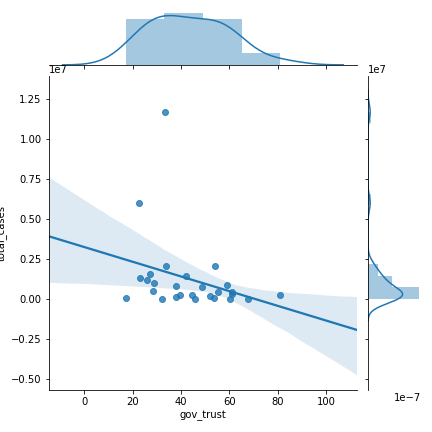

Text(0.5, 1, 'Scatter Plot with Marginal Histograms')

In [54]:
sns.jointplot(x="gov_trust", 
              y="total_cases",
              kind ="reg",
              data=dfmerge);
plt.title("COVID-19 cases vs Trust in the government", size=18, pad=80)
#plt.savefig("marginal_plot_Seaborn.png",figsize=(4,4), dpi=150)

In [53]:
dfcorr = dfmerge [['total_cases','total_deaths',,'gdp_per_capita','hospital_beds_per_thousand','gov_trust','mediarank2020','sci_agree']]
dfcorr.corr()

,total_deaths,total_cases,gdp_per_capita,hospital_beds_per_thousand,gov_trust,mediarank2020,sci_agree
total_deaths,1.000000,0.953962,-0.105726,-0.267601,-0.395651,0.308258,-0.638472
total_cases,0.953962,1.000000,0.019374,-0.167841,-0.303006,0.194589,-0.595833
gdp_per_capita,-0.105726,0.019374,1.000000,0.157294,0.594998,-0.684330,0.296989
hospital_beds_per_thousand,-0.267601,-0.167841,0.157294,1.000000,0.010952,-0.002774,0.106813
gov_trust,-0.395651,-0.303006,0.594998,0.010952,1.000000,-0.395210,0.406997
mediarank2020,0.308258,0.194589,-0.684330,-0.002774,-0.395210,1.000000,-0.452753
sci_agree,-0.638472,-0.595833,0.296989,0.106813,0.406997,-0.452753,1.000000


<IPython.core.display.Javascript object>


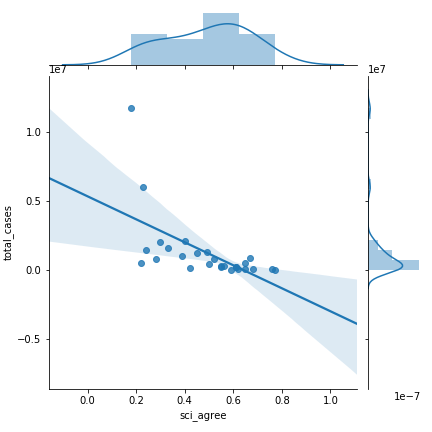

Text(0.5, 1, 'Scatter Plot with Marginal Histograms')

In [57]:
sns.jointplot(x="sci_agree", 
              y="total_cases",
              kind ="reg",
              data=dfmerge);
plt.title("COVID-19 cases vs Integrating science in policy", size=18, pad=80)
#plt.savefig("marginal_plot_Seaborn.png",figsize=(4,4), dpi=150)

<IPython.core.display.Javascript object>


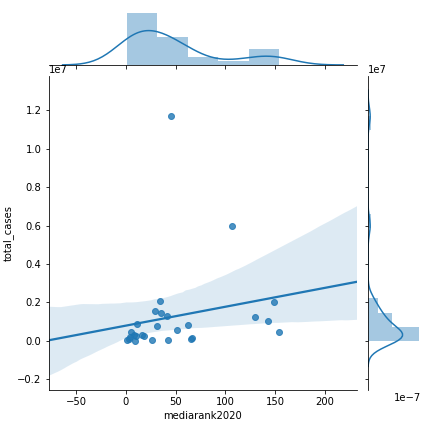

Text(0.5, 1, 'COVID-19 cases vs Integrating science in policy')

In [58]:
sns.jointplot(x="mediarank2020", 
              y="total_cases",
              kind ="reg",
              data=dfmerge);
plt.title("COVID-19 cases vs Media Freedom Ranking", size=18, pad=80)
#plt.savefig("marginal_plot_Seaborn.png",figsize=(4,4), dpi=150)

### Build a linear regression model

In [68]:
#!pip install sklearn
from sklearn import linear_model

from sklearn.linear_model import LinearRegression
regr = linear_model.LinearRegression()


In [69]:

#Creating a mask selecting random rows for the train/test split
msk = np.random.rand(len(dfmerge)) < 0.8
train = dfmerge[msk]
test = dfmerge[~msk]

train_x = np.asanyarray(train[['gov_trust']])
train_y = np.asanyarray(train[['total_deaths']])
regr.fit (train_x, train_y)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)


Coefficients:  [[-1075.54011688]]
Intercept:  [76450.98018504]


Text(47.18518954515457, 0.5, 'Emission')

<IPython.core.display.Javascript object>


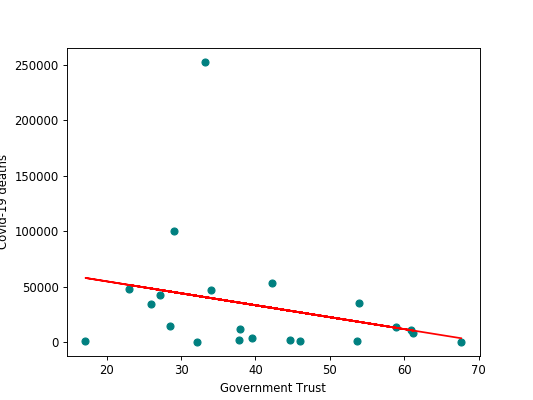

In [78]:
#Let's add a fit line
plt.scatter(train_x, train_y,  color='teal')
plt.plot(train_x, regr.coef_[0][0]*train_x + regr.intercept_[0], '-r')
plt.xlabel("Government Trust")
plt.ylabel("Covid-19 deaths")

plt.show()

### Other Useful Jupyter functionalities


#### Running Python files or other notebooks within the current notebook

In [20]:
#%run NameOfFile.ipynb

#### Adding extensions

In [26]:
#!pip install jupyter_contrib_nbextensions

#### Running Python & R simultaneously or Including other languages (you will need to make sure a kernel for that lang is setup)


In [73]:
#!pip install rpy2
%%ruby
%%R

UsageError: Line magic function `%%ruby;` not found.


#### Debug issues


In [ ]:
#%%debug filename:enter_name

#### And many more


[List of additional functionalities for further reading](http://arogozhnikov.github.io/2016/09/10/jupyter-features.html)

______________________________________

# Thank you!